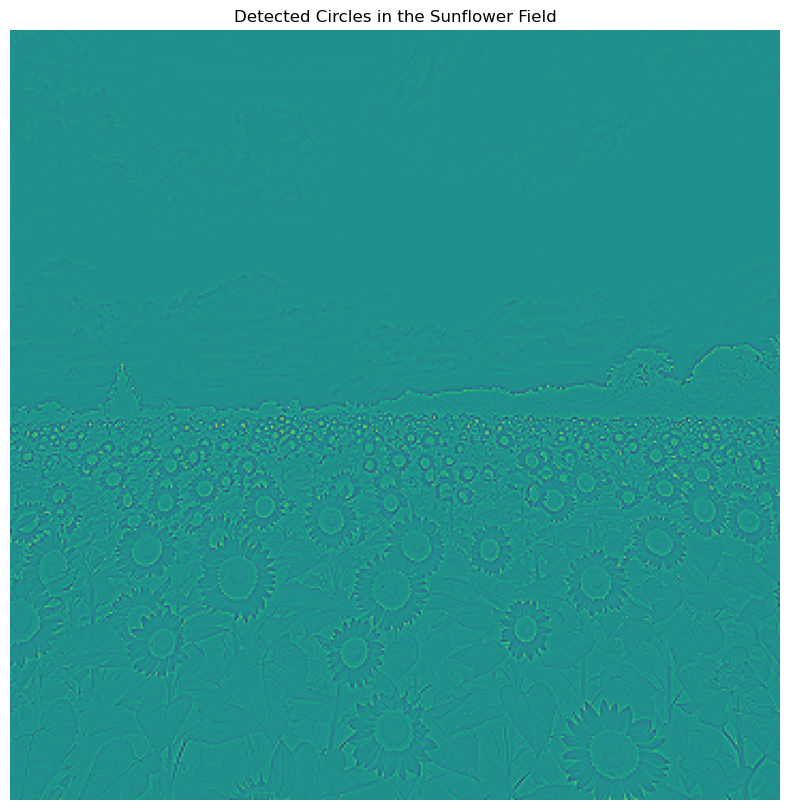

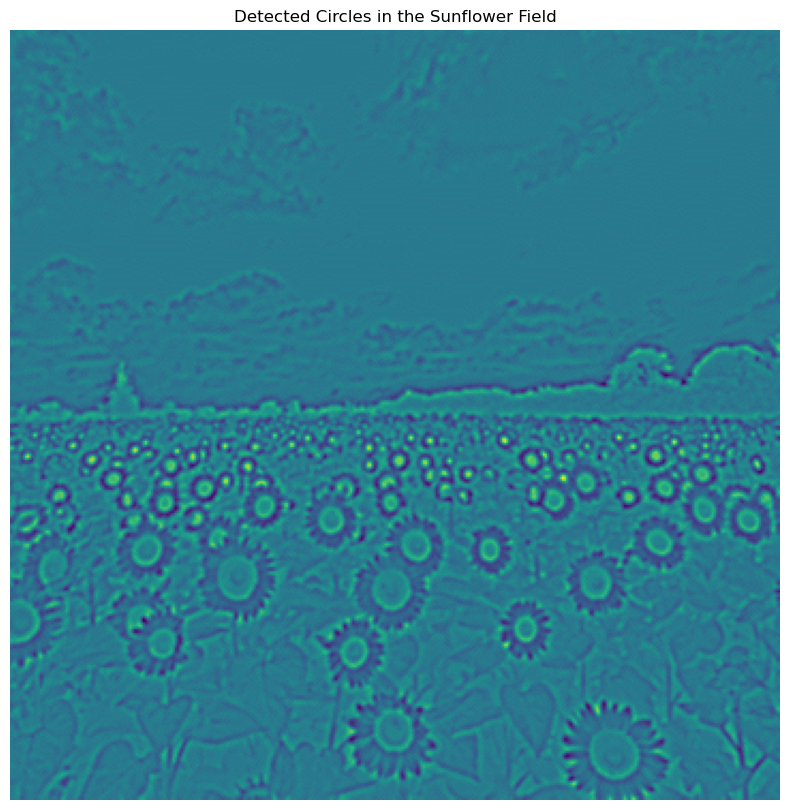

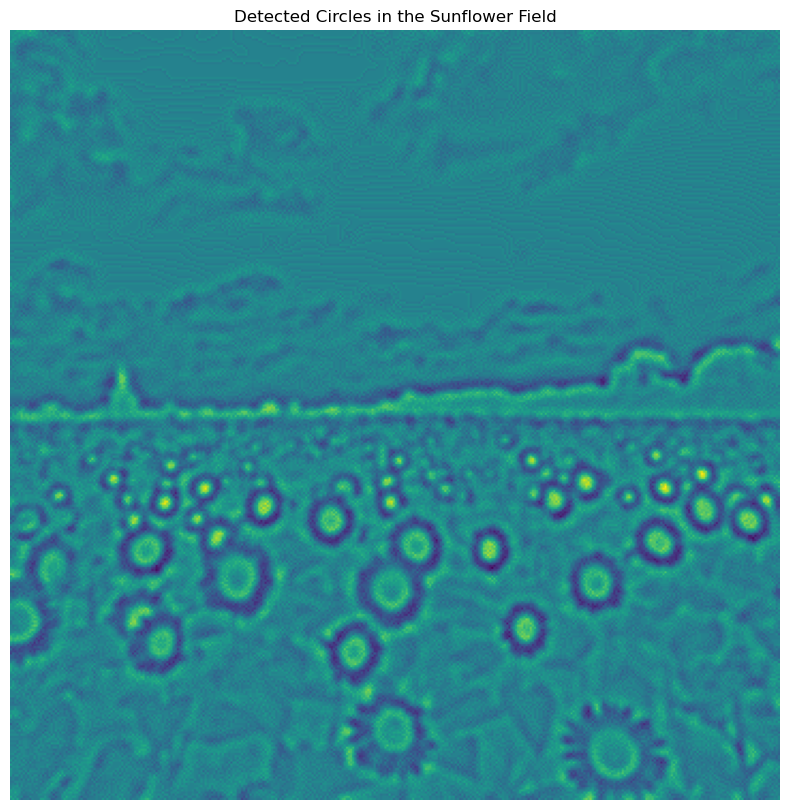

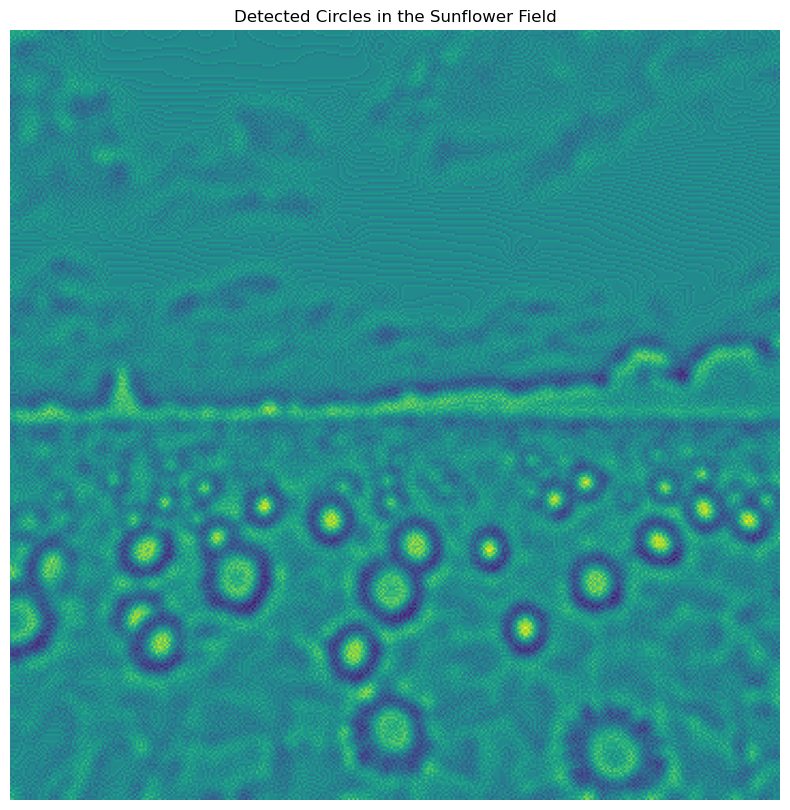

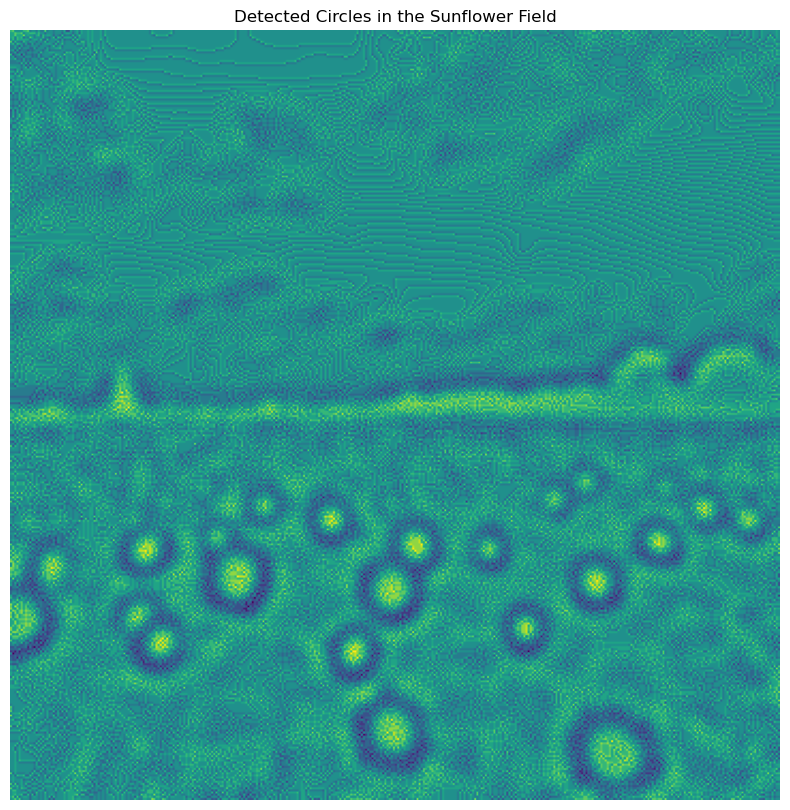

...

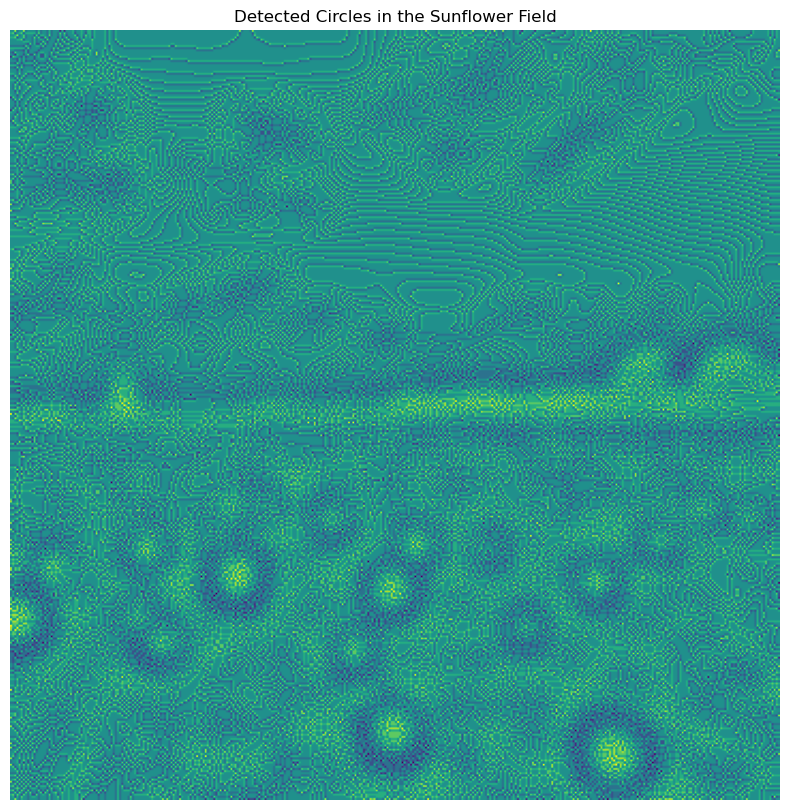

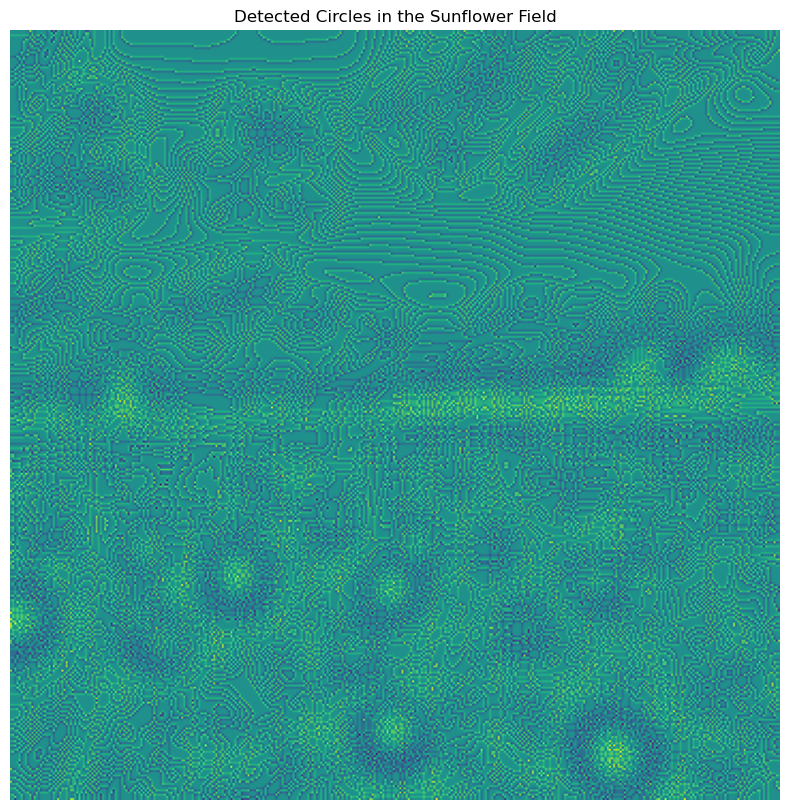

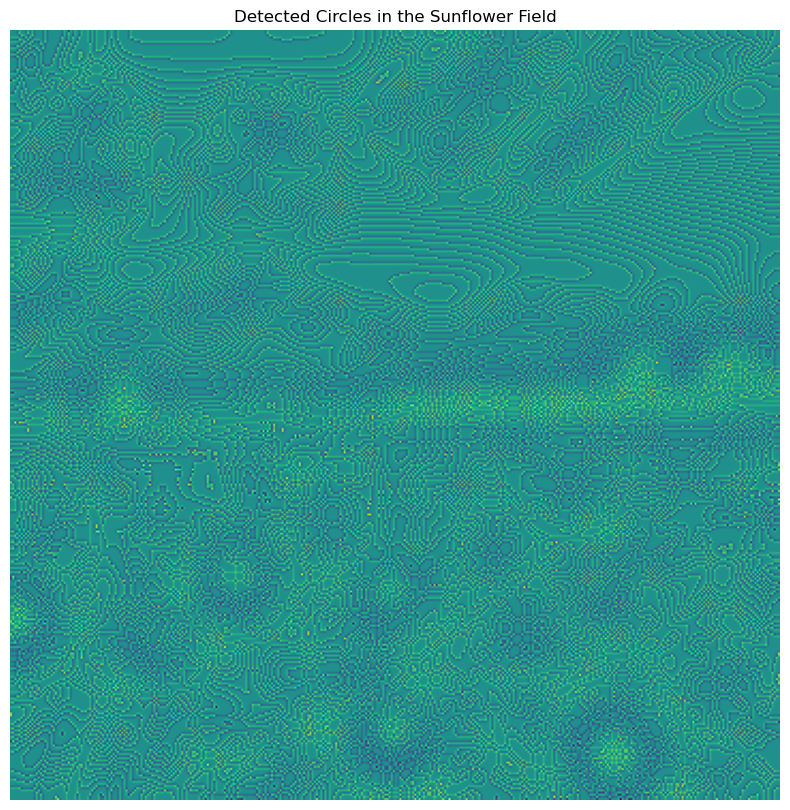

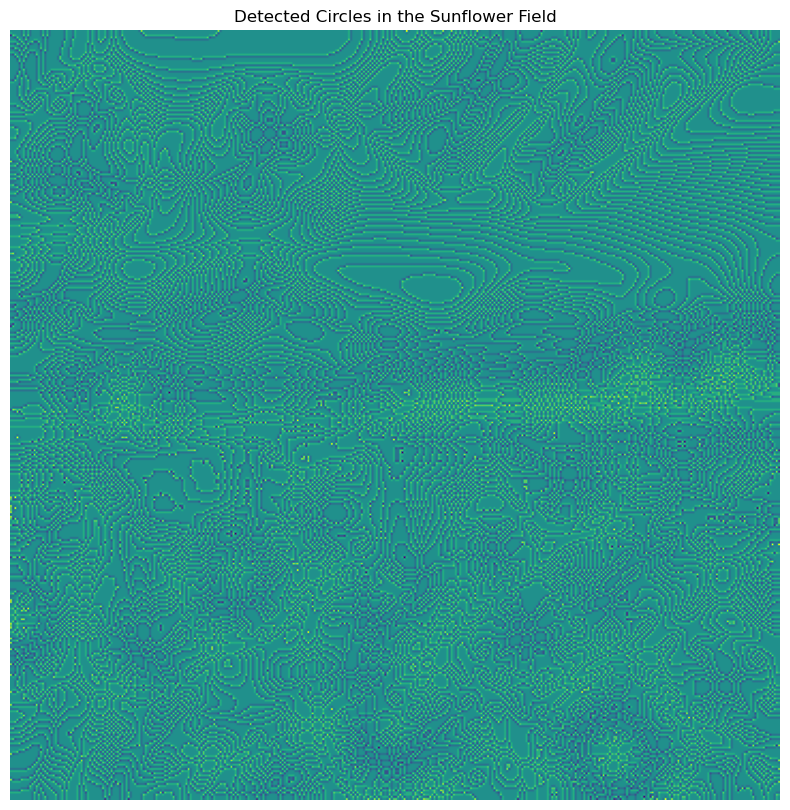

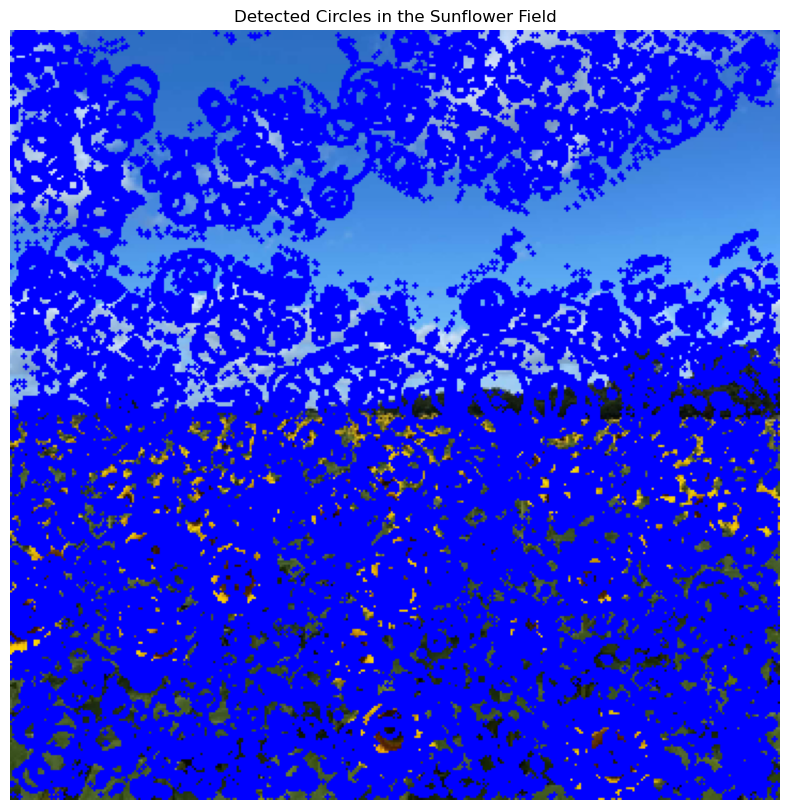

Largest circle center: (172, 202), radius: 58.28927624465569
Range of σ values used: 0.1 to 10


In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the image
im = cv.imread('../images/the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)

# Convert to grayscale
gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)

# Function to apply Gaussian blur and compute Laplacian
def laplacian_of_gaussian(image, sigma):
    # Apply Gaussian blur
    blurred = cv.GaussianBlur(image, (0, 0), sigma)
    # Apply Laplacian to detect blobs
    log = cv.Laplacian(blurred, cv.CV_64F)
    plt.figure(figsize=(10, 10))
    plt.imshow(log)
    plt.title('Detected Circles in the Sunflower Field')
    plt.axis('off')
    plt.show()
    return log

# Scale-space extrema detection parameters
min_sigma = 0.1
max_sigma = 10
num_scales = 10
sigma_values = np.linspace(min_sigma, max_sigma, num_scales)

# List to store blob details
blobs = []

# Loop through the scales
for sigma in sigma_values:
    # Compute LoG for current scale
    log_image = laplacian_of_gaussian(gray, sigma)
    
    # Square the Laplacian values (to consider intensity changes in any direction)
    log_image_sq = np.square(log_image)
    
    # Threshold to detect strong responses
    threshold = log_image_sq > log_image_sq.mean() * 1.5
    
    # Find blobs (connected regions in the thresholded image)
    contours, _ = cv.findContours(threshold.astype(np.uint8), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    
    # Store the blobs (approximate them as circles based on contour areas)
    for contour in contours:
        area = cv.contourArea(contour)
        if area > 0:
            # Approximate the radius of the blob
            radius = np.sqrt(area / np.pi)
            # Get the centroid of the blob
            M = cv.moments(contour)
            if M['m00'] != 0:
                cx = int(M['m10'] / M['m00'])
                cy = int(M['m01'] / M['m00'])
                blobs.append((cx, cy, radius))

# Draw detected blobs as circles on the original image
for (x, y, r) in blobs:
    cv.circle(im, (int(x), int(y)), int(r), (255, 0, 0), 2)

# Find the largest blob by its radius
largest_blob = max(blobs, key=lambda b: b[2])
x_largest, y_largest, r_largest = largest_blob

# Display the resulting image with circles drawn
plt.figure(figsize=(10, 10))
plt.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
plt.title('Detected Circles in the Sunflower Field')
plt.axis('off')
plt.show()

# Report the parameters of the largest circle
print(f"Largest circle center: ({x_largest}, {y_largest}), radius: {r_largest}")
print(f"Range of σ values used: {min_sigma} to {max_sigma}")
